In [1]:
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from datetime import datetime as dt

import pdb

In [2]:
selector = ['UCB', 'SGV_UCB', 'MUTUAL_INFO']
selector = ['SGV_UCB']
selectors = selector
directory = 'results/'
model = 'linear'
user = 'perfect'
fake_func = 'linear'
hyper = 'no'

colors = ['#000000', '#F0E442', '#CC79A7', '#D55E00', '#56B4E9', '#0072B2','#E69F00']

colors_dict = {'SGV_UCB': '#000000',
               'UCB': '#F0E442',
               'ABS_UCB': '#CC79A7',
               'MUTUAL_INFO': '#CC79A7',
               'RANDOM': '#F0E442',
               'BAYES_INFO_GAIN_PROBIT': '#D55E00',
               'BAYES_INFO_GAIN_999': '#56B4E9',
               'ACQ_RHO': '#0072B2',
               'ACQ_LL': '#E69F00',
               'ACQ_EPIC': '#332288',
               'ACQ_SP': '#117733',
               'ACQ_SPEAR': '#E69F00',
               'SW_ACQ_RHO': '#009E73',
               'SW_ACQ_LL': '#CC79A7',
               'SW_ACQ_EPIC': '#332288',
               'SW_ACQ_SP': '#117733',
               'SW_ACQ_SPEAR': '#F0E442',
               'SW_UCB_SPEAR': '#000000',
               'ABS_ACQ_RHO': '#000000',
               'ABS_ACQ_LL': '#000000',
               'ABS_ACQ_EPIC': '#000000',
               'ABS_ACQ_SP': '#000000',
               'ABS_ACQ_SPEAR': '#332288',
               'SW_ALT_SPEAR': '#009E73',
               'SW_MIX_SPEAR': '#D55E00',
               'SW_MIX_PEAK_SPEAR': '#117733',
               'SW_MIX_PEAK2_SPEAR': '#332288',
               'SW_MIX_PEAK3_SPEAR': '#D55E00'}


pap_colors_dict = {
               'SGV_UCB': '#000000',
               'UCB': '#000000',
               'ABS_UCB': '#000000',
               'MUTUAL_INFO': '#CC79A7',
               'RANDOM': '#56B4E9',
               'ABS_RANDOM': '#56B4E9',
               'BAYES_INFO_GAIN_PROBIT': '#D55E00',
               'BAYES_INFO_GAIN_999': '#56B4E9',
               'ACQ_RHO': '#0072B2',
               'ACQ_LL': '#E69F00',
               'ACQ_EPIC': '#332288',
               'ACQ_SP': '#117733',
               'ACQ_SPEAR': '#009E73',
               'SW_ACQ_RHO': '#0072B2',
               'SW_ACQ_LL': '#E69F00',
               'SW_ACQ_EPIC': '#332288',
               'SW_ACQ_SP': '#117733',
               'SW_ACQ_SPEAR': '#009E73',
               'ABS_ACQ_RHO': '#0072B2',
               'ABS_ACQ_LL': '#E69F00',
               'ABS_ACQ_EPIC': '#000000',
               'ABS_ACQ_SP': '#000000',
               'ABS_ACQ_SPEAR': '#009E73',
               'SW_UCB_RHO' : '#0072B2',
               'SW_UCB_LL' : '#E69F00',
               'SW_UCB_SPEAR' : '#009E73',
               'SW_FIXED_RHO' : '#0072B2',
               'SW_FIXED_LL' : '#E69F00',
               'SW_FIXED_SPEAR' : '#009E73',
               'SW_CHECK_RHO' : '#0072B2',
               'SW_CHECK_LL' : '#E69F00',
               'SW_CHECK_SPEAR' : '#009E73'
}

pap_style_sel = {
               'SGV_UCB': '-',
               'UCB': '--',
               'ABS_UCB': ':',
               'MUTUAL_INFO': '--',
               'RANDOM': '--',
               'ABS_RANDOM': ':',
               'BAYES_INFO_GAIN_PROBIT': '--',
               'BAYES_INFO_GAIN_999': '--',
               'ACQ_RHO': '--',
               'ACQ_LL': '--',
               'ACQ_EPIC': '--',
               'ACQ_SP': '--',
               'ACQ_SPEAR': '--',
               'SW_ACQ_RHO': '-',
               'SW_ACQ_LL': '-',
               'SW_ACQ_EPIC': '-',
               'SW_ACQ_SP': '-',
               'SW_ACQ_SPEAR': '-',
               'ABS_ACQ_RHO': ':',
               'ABS_ACQ_LL': ':',
               'ABS_ACQ_EPIC': ':',
               'ABS_ACQ_SP': ':',
               'ABS_ACQ_SPEAR': ':',
               'SW_UCB_RHO' : 'dashdot',
               'SW_UCB_LL' : 'dashdot',
               'SW_UCB_SPEAR' : 'dashdot',
               'SW_FIXED_RHO' : (0, (3, 1, 3, 1, 5, 5)),
               'SW_FIXED_LL' : (0, (3, 1, 3, 1, 5, 5)),
               'SW_FIXED_SPEAR' : (0, (3, 1, 3, 1, 5, 5)),
               'SW_CHECK_RHO' : (0, (7, 2, 2, 2, 7, 2)),
               'SW_CHECK_LL' : (0, (7, 2, 2, 2, 7, 2)),
               'SW_CHECK_SPEAR' : (0, (7, 2, 2, 2, 7, 2))
}



colors2_dict = {'ACQ_RHO': '#000000',
                'SW_ACQ_RHO': '#D55E00',
                'ABS_UCB': '#F0E442',}

sig_color_dict = {'0.1': '#000000',
                  '0.2': '#009E73',
                  '0.5': '#CC79A7',
                  '1.0': '#0072B2', 
                  '10.0':'#D55E00'}


alpha_color_dict = {'0.01': '#DDCC77',
                    '0.1': '#E69F00',
                    '0.2': '#56B4E9',
                    '0.25': '#009E73',
                    '0.3': '#D55E00',
                    '0.4': '#CC79A7',
                    '0.5': '#000000',
                    '0.6': '#332288',
                    '0.7': '#117733',
                    '0.75': '#F0E442',
                    '0.8': '#44AA99',
                    '0.9': '#0072B2',
                    '0.99': '#88CCEE'
                   }

alpha_style_dict = {'0.01': '-.',
                    '0.07': ':',
                    '0.15': (0,(7,3,3,1,1,)),
                    '0.1': '--',
                    '0.2': '--',
                    '0.25': '--',
                    '0.3': '#D55E00',
                    '0.4': ':',
                    '0.5': '-',
                    '0.6': '-.',
                    '0.7': '#117733',
                    '0.75': (0,(7,7,7,7)),
                    '0.8': '#44AA99',
                    '0.9': '#0072B2',
                    '0.99': '#88CCEE',
                    '1.0': (0, (5,5,1,1,2,2,3,3))
                   }

p_color_dict = {'0.01': '#D55E00',
                '0.1': '#56B4E9',
                '0.65': '#E69F00', 
                '0.7': '#009E73',
                '0.8': '#000000',
                '0.85': '#F0E442',
                '0.9': '#0072B2',
                '0.95': '#CC79A7'
               }



v_style_dict = {'10.0': '-',
                '60.0': '--',
                '80.0': '--',
                '160.0': ':',
                '2000.0' : '-.',
                '50000.0': (0, (7, 7, 7, 7, 7, 7)),
                '1.3': '-.',
                '300.0': ':',
                '0.5': (0, (7, 7, 7, 7, 7, 7)),
                '3.0': (0, (5,2,5,1,1,1,1,1)),
                '15.0': (0, (7,2,7,2)),
                '20.0': (0,(7,1,7,1,7,1,7,1)),
                '30.0': (0,(2,7,7,2,3,2,5)),
                '40.0': (0,(5,1,1,1,1,1,1)),
                '50.0': (0,(9,5,9,1,1,1)),
                '100.0': (0,(11,1,11,2))}

v_color_dict = {'1.0': '#000000',
                '5.0': '#E69F00',
                '10.0': '#117733',
                '30.0': '#56B4E9', 
                '50.0': '#009E73',
                '60.0': '#F0E442',
                '120.0': '#0072B2',
                '200.0': '#D55E00',
                '2000.0': '#CC79A7',
                '50000.0': '#332288'}

comp_type_c_dict = {'stable': '#000000',
                    'sampled': '#E69F00',}


#'-','--',':','-.'
sel_style_dict = {'ABS_UCB': '-',
                'SW_UCB_RHO': '--',
                'SW_UCB_SPEAR': ':',
                'SW_UCB_LL' : '-.',
                'ACQ_SPEAR': (0, (7, 7, 7, 7, 7, 7))}

#sig_style_dict = {'0.1': '-',
#                '1.0': '--',
#                '10.0': ':'}

rbf_style_dict = {  '0.1': (0, (3, 1, 3, 1, 5, 5)),
                    '0.4': ':',
                    '0.6': (0, (5, 1, 5, 1, 1, 1)),
                    '0.8': '-.',
                    '1.0': (0, (3, 1, 1, 1, 1, 1)),
                    '1.2': '--',
                    '1.5': '-',
                    '10.0': (0, (7, 7, 7, 7, 7, 7))}

sig_style_dict = {  '0.1': '--',
                    '0.5': (0, (7,7,7,7,7,7)),
                    '0.01': (0, (7,1,1,1,1,1)),
                    '0.2' : '-',
                    '0.3': '-.',
                    '1.0': ':', 
                    '1.5': '-.',
                    '2.0': (0, (3, 1, 1, 1, 1, 1)),
                    '5.0': (0, (7,7,7,7,7,7)),
                    '10.0': (0, (3, 1, 3, 1, 5, 5))}

kmed_style_dict = {'True': '--',
                    'False': '-',
                    'uni': ':', 
                    'downhull': '-.',
                    'medrand': (0, (3, 1, 1, 1, 1, 1))}

model_style_dict = {'gp': '-',
                    'linear': '--'}




def selector_text_f(selector):
    selector_text = ''
    if selector == 'SGV_UCB':
        selector_text = 'SGV-UCB'
    elif selector == 'UCB':
        selector_text = 'Pair UCB'
    elif selector == 'ABS_UCB':
        selector_text = 'Abs. UCB'
    elif selector == 'MUTUAL_INFO':
        selector_text = 'Pair Mutual Information'
    elif selector == 'RANDOM':
        selector_text = 'Pair Random'
    elif selector == 'ABS_RANDOM':
        selector_text = 'Abs. Random'
    elif selector == 'BAYES_INFO_GAIN_PROBIT':
        selector_text = 'Reward Optimization'
    elif selector == 'ACQ_RHO':
        selector_text = 'Pair  Acq.-rho'
    elif selector == 'SW_ACQ_RHO':
        selector_text = 'Mix. Acq.-rho'
    elif selector == 'SW_UCB_RHO':
        selector_text = 'Mix. UCB-RHO'
    elif selector == 'SW_FIXED_RHO':
        selector_text = 'Mix. Fixed time Switch UCB-RHO'
    elif selector == 'ABS_ACQ_RHO':
        selector_text = 'Abs. acquisition-rho'
    elif selector == 'SW_CHECK_RHO':
        selector_text = 'Chk. Acq.-rho'
    elif selector == 'SW_ACQ_LL':
        selector_text = 'Mix. acquitition-ll'
    elif selector == 'SW_UCB_LL':
        selector_text = 'Mix. UCB-LL'
    elif selector == 'SW_FIXED_LL':
        selector_text = 'Mix. Fixed time Switch UCB-LL'
    elif selector == 'ACQ_LL':
        selector_text = 'Pair Acquisition loglikelihood'
    elif selector == 'ABS_ACQ_LL':
        selector_text = 'Abs. Acquisition-ll'
    elif selector == 'SW_CHECK_LL':
        selector_text = 'Chk. Acq.-LL'
    elif selector == 'ACQ_EPIC' or selector == 'SW_ACQ_EPIC':
        selector_text = 'Acquisition EPICish'
    elif selector == 'ACQ_SP':
        selector_text = 'Acquisition Spearman old'
    elif selector == 'ACQ_SPEAR':
        selector_text = 'Pair Acq-Spear'
    elif selector == 'SW_ACQ_SPEAR':
        selector_text = 'Mix. Acquisition Spearman'
    elif selector == 'SW_UCB_SPEAR':
        selector_text = 'Mix. UCB-Spear'
    elif selector == 'ABS_ACQ_SPEAR':
        selector_text = 'Abs. Acq.-Spear'
    elif selector == 'SW_CHECK_SPEAR':
        selector_text = 'Chk. Acq.-Spear'
    elif selector == 'SW_FIXED_SPEAR':
        selector_text = 'Mix. Fixed time Switch UCB-SPEAR'
    elif selector == 'SW_DEC_SPEAR':
        selector_text = 'Mix. Decision switch UCB-SPEAR'
    elif selector == 'SW_ALT_SPEAR':
        selector_text = 'Alternating Spearman'
    elif selector == 'SW_MIX_SPEAR':
        selector_text = 'Mix. Mixture Sel. Spearman'
    elif selector == 'SW_MIX_PEAK_SPEAR':
        selector_text = 'Mix. Mixed peaky Spearman'
    elif selector == 'SW_MIX_PEAK2_SPEAR':
        selector_text = 'Mix. Mixed peaky 2 Spearman'
    elif selector == 'SW_MIX_PEAK3_SPEAR':
        selector_text = 'Mix. Mixed peaky 3 Spearman'
    else:
        print('Unknown selector: ' + selector)
    
    return selector_text


In [3]:
def filter_by_time(names, after=None, before=None):
    fmt_str = '%Y-%m-%d_%H-%M-%S'
    
    if after is not None:
        after_d = dt.strptime(after, fmt_str)
        
        if before is not None:
            # only keep values between before and after
            
            before_d = dt.strptime(before, fmt_str)
            filtered = [n for n in names if dt.strptime(n[-34:-15], fmt_str) > after_d and dt.strptime(n[-34:-15], fmt_str) < before_d]
        else:
            # only keep values after
            filtered = [n for n in names if dt.strptime(n[-34:-15], fmt_str) > after_d]
    else:
        if before is not None:
            # only keep names before
            before_d = dt.strptime(before, fmt_str)
            filtered = [n for n in names if dt.strptime(n[-34:-15], fmt_str) < before_d]
        else:
            # just return everything
            filtered = names
    return filtered
        
print(filter_by_time(['asdagads-adsfa-dsf-adsfa-awfe-2024-08-09_13-22-45/train_data.npz'], '2024-08-07_00-25-47'))
print(filter_by_time(['asdagads-adsfa-dsf-adsfa-awfe-2024-08-06_13-22-45/train_data.npz'], '2024-08-07_00-25-47'))
print(filter_by_time(['asdagads-adsfa-dsf-adsfa-awfe-2024-08-06_13-22-45/train_data.npz'], before='2024-08-07_00-25-47'))
print(filter_by_time(['asdagads-adsfa-dsf-adsfa-awfe-2024-08-06_13-22-45/train_data.npz'], before='2024-08-07_00-25-47', after='2024-07-07_00-25-47'))

['asdagads-adsfa-dsf-adsfa-awfe-2024-08-09_13-22-45/train_data.npz']
[]
['asdagads-adsfa-dsf-adsfa-awfe-2024-08-06_13-22-45/train_data.npz']
['asdagads-adsfa-dsf-adsfa-awfe-2024-08-06_13-22-45/train_data.npz']






alpha=0.5
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env4_2024-12-05_05-36-59/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env2_2024-12-05_05-36-59/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env3_2024-12-05_05-36-59/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stab

results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env1_2024-12-10_15-21-35/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env6_2024-12-10_15-21-34/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env5_2024-12-10_15-21-35/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env4_2024-12-10_15-21-34/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_s





alpha=0.5
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env5_2024-12-05_03-50-17/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env8_2024-12-05_03-50-18/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env7_2024-12-05_03-50-18/train_data.npz
results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_u

results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env6_2024-12-10_14-59-47/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env5_2024-12-10_14-59-47/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env1_2024-12-10_14-59-47/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env7_2024-12-10_14-59-47/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switc





alpha=0.1
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
['Mix. Mixed peaky Spearman $ \\alpha =$0.5 $p_{abs}=$0.8 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\a

results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env9_2024-12-09_14-19-58/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env0_2024-12-09_14-19-58/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env2_2024-12-09_14-19-59/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env1_2024-12-09_14-19-58/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switc

results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env2_2024-12-10_14-38-11/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env5_2024-12-10_14-38-10/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env9_2024-12-10_14-38-11/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env4_2024-12-10_14-38-11/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switc





alpha=0.1
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
['Mix. Mixed peaky Spearman $ \\alpha =$0.5 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\a

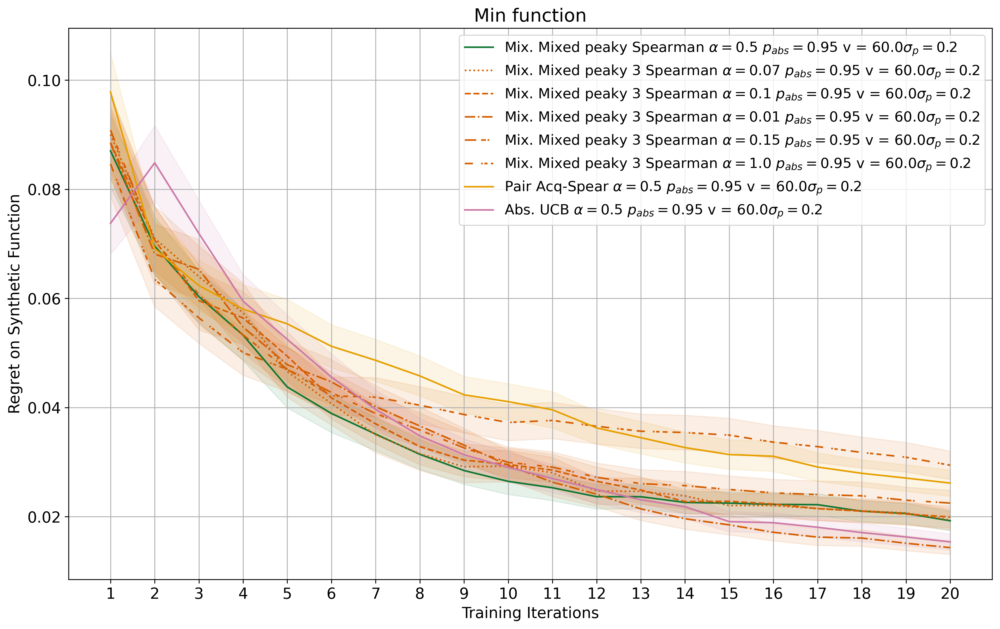

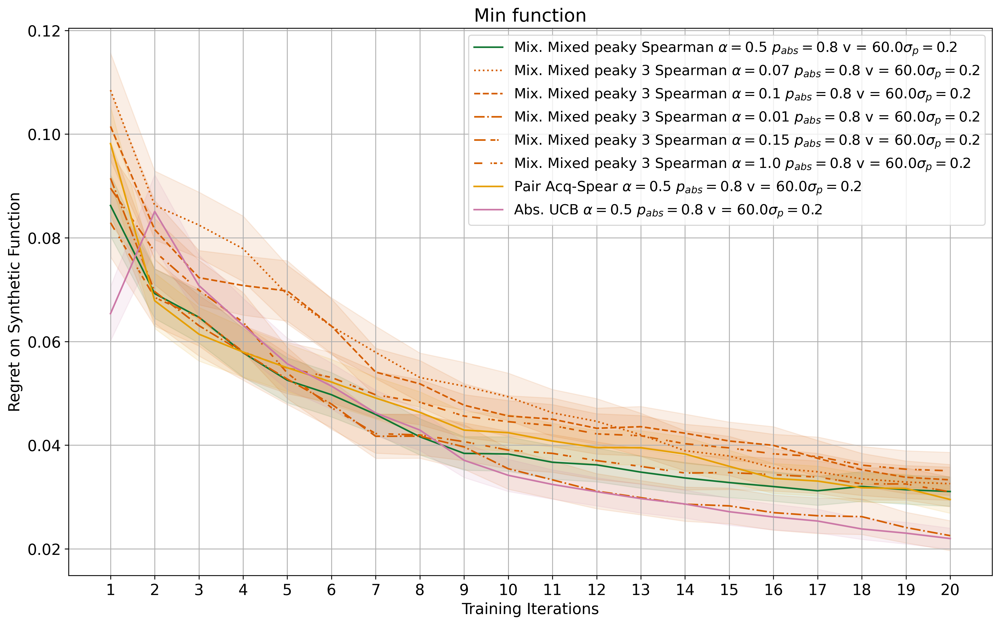

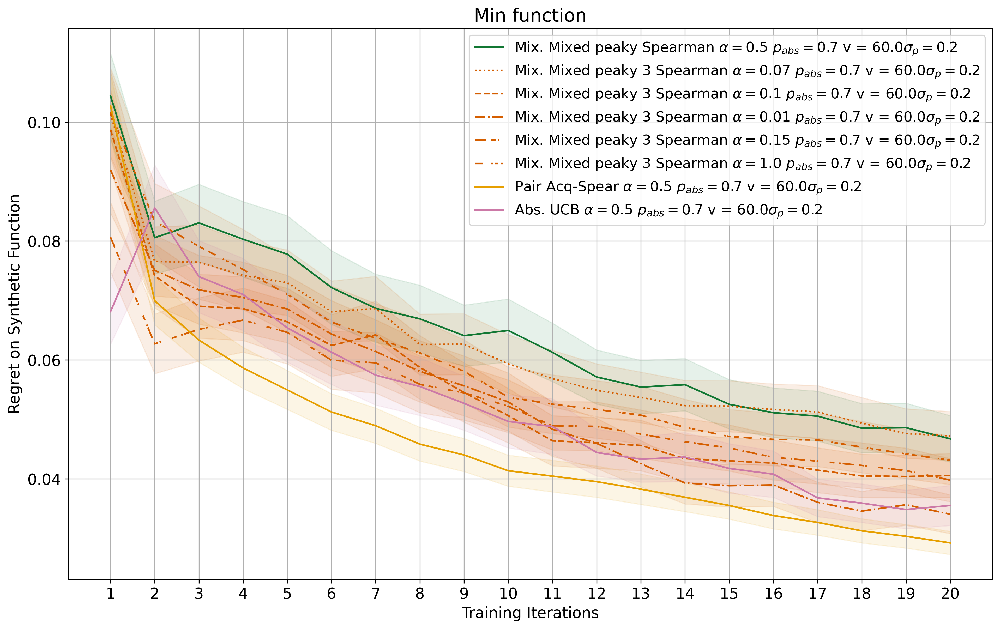

In [4]:

def selector_plot(selectors, show_avg_sel=False, fake_funcs=['min'], pabs_strs=['0.95'], vs=['60.0'], sigpairs=['0.2']):
    user_types = ['human_choice']
    #after_time = '2024-10-15_18-00-00'
    #after_time = '2024-10-23_12-30-00'
    after_time = '2024-11-21_18-00-00'
    before_time = '2025-10-15_16-00-00'
    #before_time = '2024-10-23_12-30-00'

    pareto='False'

    models = ['gp']
    user = 'human_choice'
    select = 'switch'
    hypers = ['no']
    #hyper = hypers[0]

    plot_data = []

    plt.rc('font', size=14)
    plt.rc('ytick', labelsize=14)
    plt.rc('xtick', labelsize=14)


    linestyles=['-','--',':','-.']


    color_idx = 0
    line_style_idx = 0

    leg_txt = []

    show_avg_sel = show_avg_sel

    query_sizes = ['2']
    #vs=['50000.0', '2000.0', '60.0', '10.0']
    #vs=['60.0']
    #sigpairs=['0.1', '0.01']
    #sigpairs = ['0.2', '0.1', '0.3', '0.01', '0.5', '1.0']
    sigabss=['1.0']
    rbfls = ['1.2']

    comp_type = 'stable'
    
    rbfsigs = ['1.0']
    kmeds = ['medrand']

    ppair_str = '0.95'
    #pabs_strs = ['0.95', '0.9', '0.85', '0.8', '0.7', '0.65']

    #alphas = ['0.1', '0.9', '0.5']
    alphas = ['0.5', '0.07', '0.1', '0.01', '0.15', '1.0']
    fake_alphas = ['0.5']
    

    ax = plt.gca()
    if show_avg_sel:
        ax2 = ax.twinx()

    for j, fake_func in enumerate(fake_funcs):
        line_style_idx = 0
        for i, selector in enumerate(selectors):
            for l, hyper in enumerate(hypers):
                for k, model in enumerate(models):
                    for m, v in enumerate(vs):
                        for n, sigpair in enumerate(sigpairs):
                            for o, sigabs in enumerate(sigabss):
                                for rbfl in rbfls:
                                    for rbfsig in rbfsigs:
                                        for query_size in query_sizes:
                                            for kmed in kmeds:
                                                for alpha in alphas:
                                                    print('\n\n\n\nalpha=' + str(alpha))
                                                    
                                                    for fake_alpha in fake_alphas:
                                                        for pabs_str in pabs_strs:
                                                            kmed_str = '_kmed_'+str(kmed)
                                                            if selector == 'ABS_RANDOM':
                                                                glob_selector = 'RANDOM'
                                                                select = 'rating'
                                                            elif selector == 'ABS_UCB':
                                                                glob_selector = 'UCB'
                                                                select = 'rating'
            #                                                 elif selector == 'ABS_ACQ_SPEAR':
            #                                                     glob_selector = selector
            #                                                     select = 'rating'
                                                            else:
                                                                glob_selector = selector
                                                                select = 'switch'


                                                            v_sel = v
                                                            if selector == 'ACQ_SPEAR':
                                                                if fake_func == 'min':
                                                                    if v == vs[0]:
                                                                        if pabs_str == '0.8' or pabs_str == '0.95':
                                                                            v_sel = '100.0'
                                                                        else:
                                                                            v_sel = '60.0'
                                                                    else:
                                                                        v_sel = 'afwefaef'
                                                                else:
                                                                    if v == vs[0]:
                                                                        v_sel = '0.5'
                                                        
                            
                                                            sub_str_alpha = '_falp_' + fake_alpha +'_'+hyper+'_v_'+v_sel+'_sigabs_'+sigabs+'_sigpair_'+sigpair+ '_alpha_' + alpha
                                                            if (selector == 'ABS_UCB' or selector == 'ACQ_SPEAR') and alpha == '0.5':
                                                                sub_str_alpha = '_falp_' + fake_alpha +'_'+hyper+'_v_'+v_sel+'_sigabs_'+sigabs+'_sigpair_'+sigpair+ '_alpha_' + '0.5'
                                        #if (selector in ['ABS_UCB', 'ACQ_SPEAR']) and alpha == '0.5':
                                                            #    sub_str_alpha = '_'+hyper+'_v_'+v+'_sigabs_'+sigabs+'_sigpair_'+sigpair

                                                            glob_check = directory+'AT_'+glob_selector+'_model_'+model+'_'+select+'_'+comp_type+'_user_'+user+query_size+'_fake_'+fake_func+'_pareto_'+pareto+kmed_str+'_ppair_' + ppair_str + '_pabs_'+ pabs_str + sub_str_alpha +'_rbfl_'+rbfl+'_rbfsig_'+\
                                                                            rbfsig+'_env*/train_data.npz'

                                                            after_time_this = after_time
                                                            if selector == 'ABS_UCB':
                                                                after_time_this = '2024-11-19_01-00-00'
                                                
                                                            print('\t'+glob_check)
                                                            files = glob(glob_check)
                                                            files = filter_by_time(files, before=before_time, after=after_time_this)

                                                            if len(files) > 0:
                                                                score_diffs = np.empty((0,21))
                                                                avg_selections = np.empty((0, 21))
                                                                for file in files:
                                                                    data_file = np.load(file)
                                                                    print(file)

                                                                    # read in score diff
                                                                    score_diff = np.mean(data_file['score_diff'], axis=(2,))

                                                                    score_diffs = np.append(score_diffs, score_diff, axis=0)

                                                                    if 'query_type_is_abs' in data_file:
                                                                        avg_selection = data_file['query_type_is_abs']
                                                                        #avg_selection = data_file['query_is_correct']
                                                                        avg_selections = np.append(avg_selections, avg_selection, axis=0)

                                                                print(score_diffs.shape)

                                                                itr_to_show = 21

                                                                mean_diffs = np.mean(score_diffs, axis=0)
                                                                std_diffs = np.std(score_diffs, axis=0)
                                                                print('standard diffs shape: '+ str(score_diffs.shape))
                                                                std_error_mean = std_diffs / np.sqrt(score_diffs.shape[0])
                                                                print(mean_diffs.shape)

                                                                if 'query_type_is_abs' in data_file:
                                                                    mean_sels = np.mean(avg_selections, axis=0)
                                                                    std_sels = np.std(avg_selections, axis=0)
                                                                    std_error_mean_sels = std_sels / np.sqrt(avg_selections.shape[0])

                                                                x = np.arange(1,itr_to_show)

                                                                sigma_to_plot = 1.0

                                                                # get colors
                                                                #c1 = alpha_color_dict[alpha]
                                                                #s1 = sel_style_dict[selector]#pap_style_sel[selector]
                                                                if alpha == '0.9':
                                                                    if selector == 'ABS_UCB':
                                                                        s1 = '-'
                                                                    elif selector == 'ACQ_SPEAR':
                                                                        s1 =  (0, (7, 7, 7, 7, 7, 7))
                                                                    else:
                                                                        s1 = '--'
                                                                elif alpha == '0.1':
                                                                    s1 = '-.'
                                                                elif alpha == '0.5': 
                                                                    if selector == 'ABS_UCB':
                                                                        s1 = '-'
                                                                    elif selector == 'ACQ_SPEAR':
                                                                        s1 =  (0, (7, 7, 7, 7, 7, 7))
                                                                    elif selector == 'SW_ALT_SPEAR':
                                                                        s1 = '-.'
                                                                    else:
                                                                        s1 = ':'
                                                                  
                                                                
                                                                s1 = alpha_style_dict[alpha]
                                                                if len(sigpairs) > 1:
                                                                    s1 = sig_style_dict[sigpair]
                                                                #c1 = p_color_dict[pabs_str]
                                                                c1 = colors_dict[selector]
                                                                
                                                                c2 = c1#colors_dict[selector]
                                                                s2 = '-.'



                                                                ax.fill_between(x, \
                                                                                        mean_diffs[1:itr_to_show]-(sigma_to_plot*std_error_mean[1:itr_to_show]), \
                                                                                        mean_diffs[1:itr_to_show]+(sigma_to_plot*std_error_mean[1:itr_to_show]), \
                                                                                        color=c1, \
                                                                                        alpha=0.1, \
                                                                                        label='_nolegend_')
                                                                ax.plot(x, mean_diffs[1:itr_to_show], color=c1, linestyle=s1)

                                                                if 'query_type_is_abs' in data_file and show_avg_sel:
                #                                                     ax2.fill_between(x, \
                #                                                                             mean_sels[1:itr_to_show]-(sigma_to_plot*std_error_mean_sels[1:itr_to_show]), \
                #                                                                             mean_sels[1:itr_to_show]+(sigma_to_plot*std_error_mean_sels[1:itr_to_show]), \
                #                                                                             color=c1, \
                #                                                                             alpha=0.1, \
                #                                                                             label='_nolegend_')
                                                                    #mean_sels = [np.mean(mean_sels)] * len(mean_sels)
                                                                    ax2.plot(x, mean_sels[1:itr_to_show], color=c2, linestyle=s2, label='_nolegend_')
                                                                    ax2.set_ylabel('Selecting pair or abs abs=1, pair=0')
                                                                    #ax2.set_ylabel('Training data was correct')

                                                                selector_text = selector_text_f(selector) + r' $ \alpha =$'+str(alpha) + r' $p_{abs}=$' + str(pabs_str) + ' v = ' + str(v) + r'$\sigma_{p}=$' + str(sigpair)
                                                                leg = selector_text
                                                                leg_txt.append(leg)

                                                                color_idx += 1
                                                                line_style_idx += 1
                                                    
                                                    
        

    print(leg_txt)
    ax.legend(leg_txt, bbox_to_anchor=(1.0, 1.0), prop={'size': 13})

    plt.xlabel('Training Iterations')
    ax.set_ylabel('Regret on Synthetic Function')
    #plt.title('Regret on geologist domain (GP model)')
    plt.xticks(range(1,21))

    plt.grid()

    plt.tight_layout()
    

##### Generate all o

figsize_l = (13,8)
figsize=(7,5)
dpi=300

#plt.figure(figsize=figsize_l, dpi=dpi)
#selector_plot(['SW_UCB_SPEAR'], False, ['min'], ['0.7', '0.8', '0.95'], vs=['60.0'])
#plt.title('Min function')

#plt.figure(figsize=figsize_l, dpi=dpi)
#selector_plot(['SW_UCB_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['min'], ['0.7', '0.8','0.95'], vs=['1.3', '10.0', '300.0', '60.0'])
#plt.title('Min function')
vs_all = ['0.5', '1.3', '3.0', '10.0', '15.0', '20.0', '30.0', '40.0', '50.0', '60.0', '80.0', '100.0', '300.0']

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK_SPEAR', 'SW_MIX_PEAK3_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['min'], ['0.95'], vs=['60.0'])
plt.title('Min function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK_SPEAR', 'SW_MIX_PEAK3_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['min'], ['0.8'], vs=['60.0'])
plt.title('Min function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK_SPEAR', 'SW_MIX_PEAK3_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['min'], ['0.7'], vs=['60.0'])
plt.title('Min function')






plt.show()





alpha=0.5
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.07
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env0_2024-12-09_23-26-43/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env9_2024-12-09_23-26-43/train_data.npz
results/AT_SW_MIX_PEAK3_SP

(200, 21)
standard diffs shape: (200, 21)
(21,)




alpha=0.07
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.1
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train





alpha=0.15
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
['Mix. Mixed peaky 3 Spearman $ \\alpha =$0.07 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.1 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.01 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.15 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$1.0 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky Spearman $ \\alpha =$0.5 $p_{abs}=$0.95 v = 60.0$\\sigma_{p}=$0.2', 'Pair Acq-Spear $ 





alpha=0.1
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.5
	results/AT_ACQ_SPEAR_model_gp





alpha=0.5
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.07
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env1_2024-12-09_19-42-00/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env4_2024-12-09_19-41-59/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_





alpha=0.07
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.1
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_SW_MIX_PEAK_SPEA





alpha=1.0
	results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_logistic_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
['Mix. Mixed peaky 3 Spearman $ \\alpha =$0.07 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.1 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.01 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$0.15 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky 3 Spearman $ \\alpha =$1.0 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Mix. Mixed peaky Spearman $ \\alpha =$0.5 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Pair Acq-Spear $ \\alpha =$0.5 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2', 'Abs. UCB $ \\alpha =$0.5 $p_{abs}=$0.7 v = 60.0$\\sigma_{p}=$0.2']


Text(0.5, 1.0, 'Logistic function')

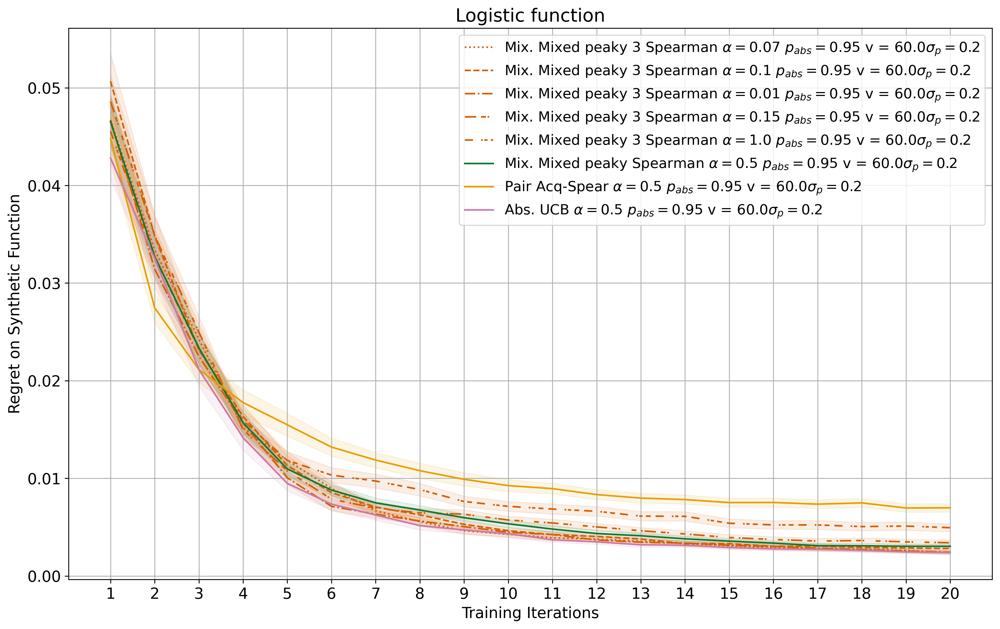

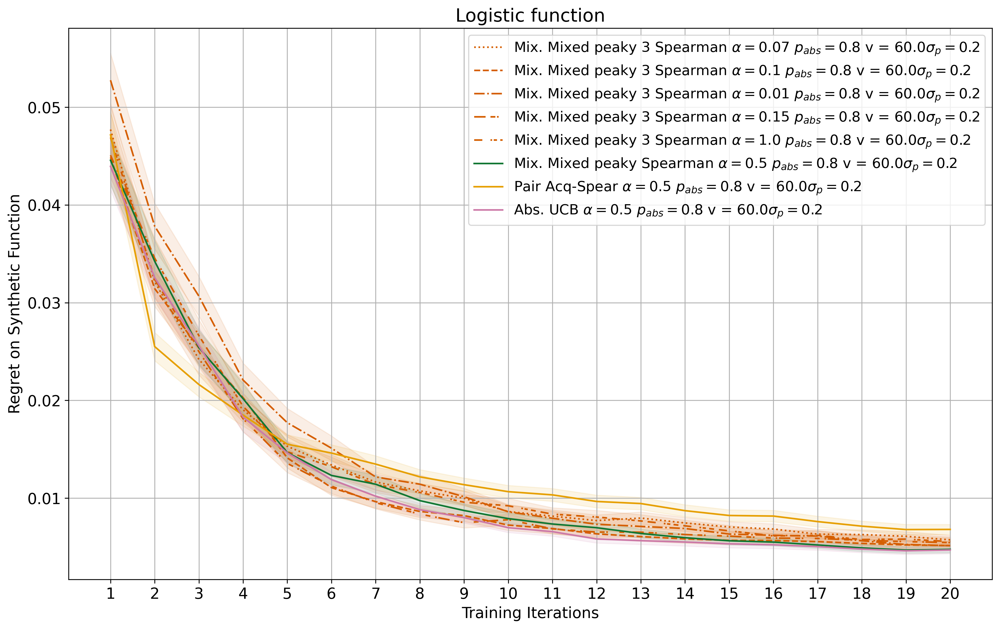

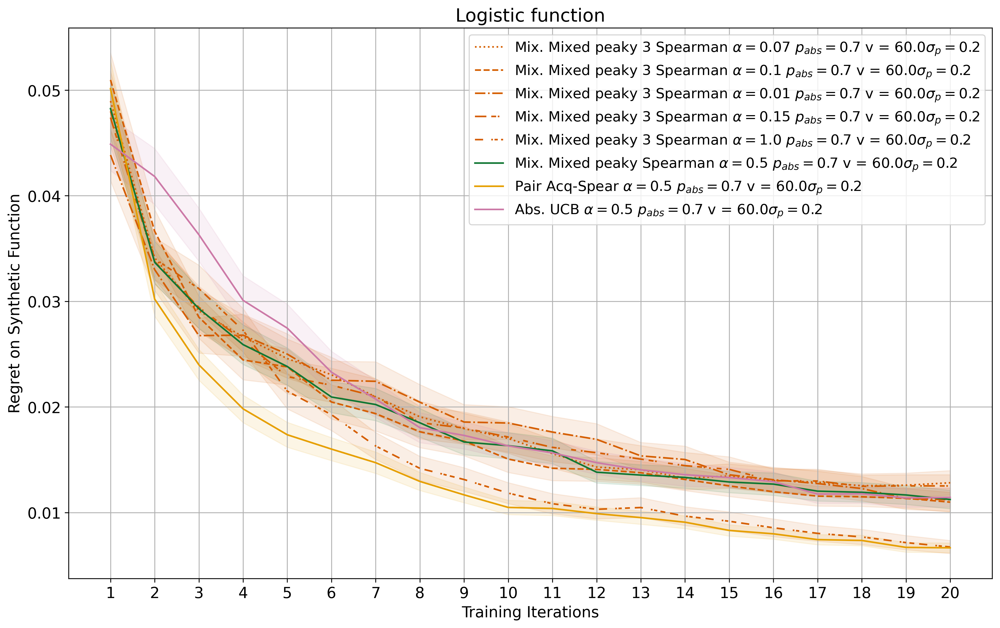

In [5]:
plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['logistic'], ['0.95'], vs=['60.0'])
plt.title('Logistic function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['logistic'], ['0.8'], vs=['60.0'])
plt.title('Logistic function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['logistic'], ['0.7'], vs=['60.0'])
plt.title('Logistic function')





alpha=0.5
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.07
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env7_2024-12-10_04-57-31/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env8_2024-12-10_04-57-30/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_mode





alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.5
	results/AT_ACQ_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_0.5_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_ACQ_SPEAR_model_gp_switch_stable_user_human_ch





alpha=0.5
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.07
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env5_2024-12-10_03-06-36/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env4_2024-12-10_03-06-37/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp





alpha=0.1
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.1_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.5
	results/AT_ACQ_SPEAR_model_gp_switch_





alpha=0.5
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.07
	results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env7_2024-12-10_01-17-12/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.07_rbfl_1.2_rbfsig_1.0_env0_2024-12-10_01-17-12/train_data.npz
results/AT_SW_MIX_PEAK3_SPEAR_model_gp





alpha=0.01
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.01_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.15
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_0.15_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=1.0
	results/AT_SW_MIX_PEAK_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_60.0_sigabs_1.0_sigpair_0.2_alpha_1.0_rbfl_1.2_rbfsig_1.0_env*/train_data.npz




alpha=0.5
	results/AT_ACQ_SPEAR_model_gp_switch_stable_user_human_choice2_fake_linear_pareto_False_kmed_medrand_ppair_0.95_pabs_0.7_falp_0.5_no_v_0.5_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz
results/AT_ACQ_SPEAR_model_gp_switch_stable_user_human_choice

Text(0.5, 1.0, 'Linear function')

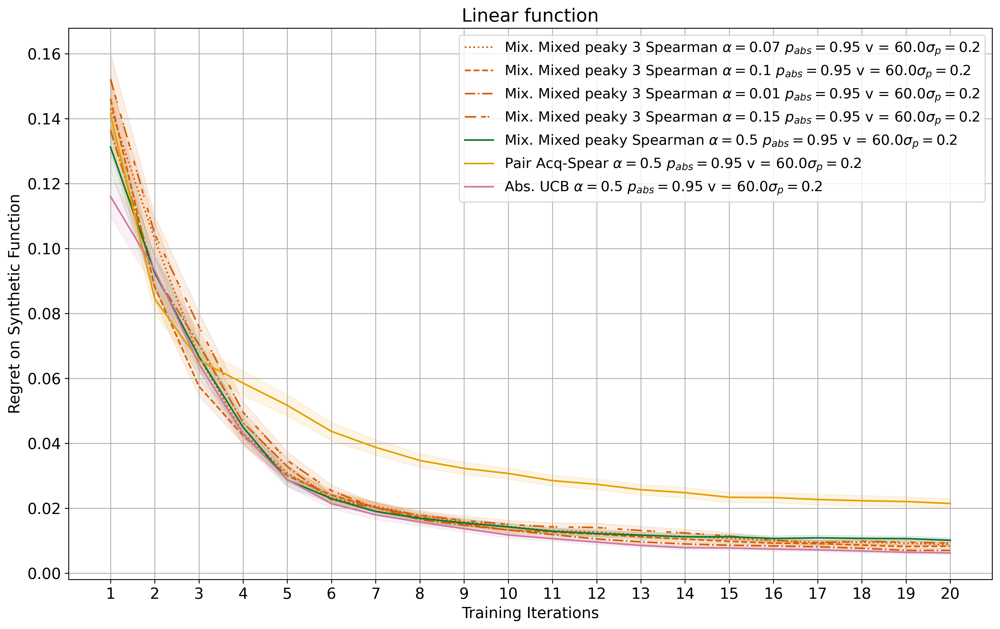

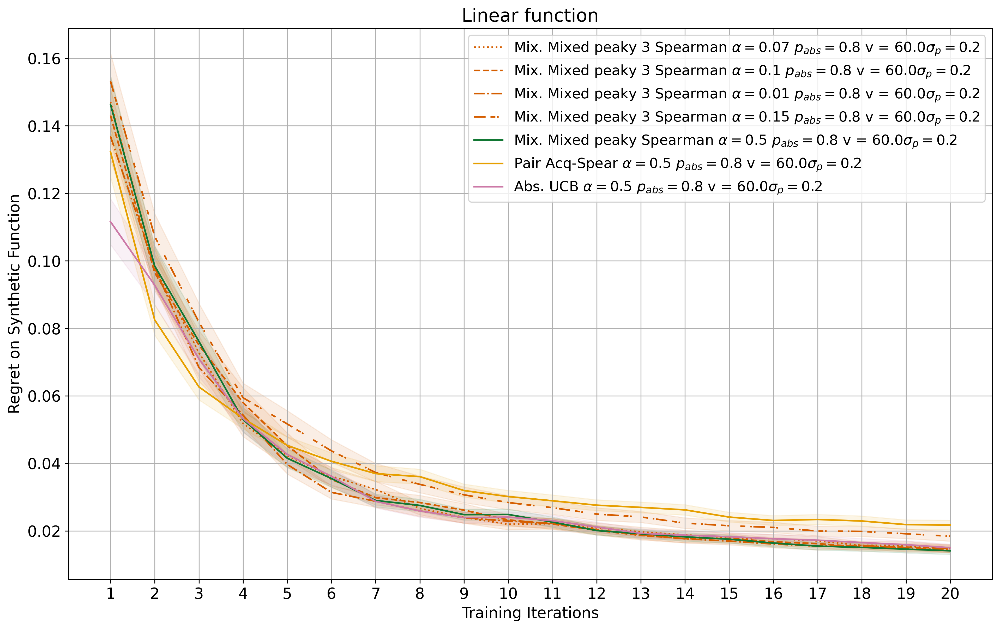

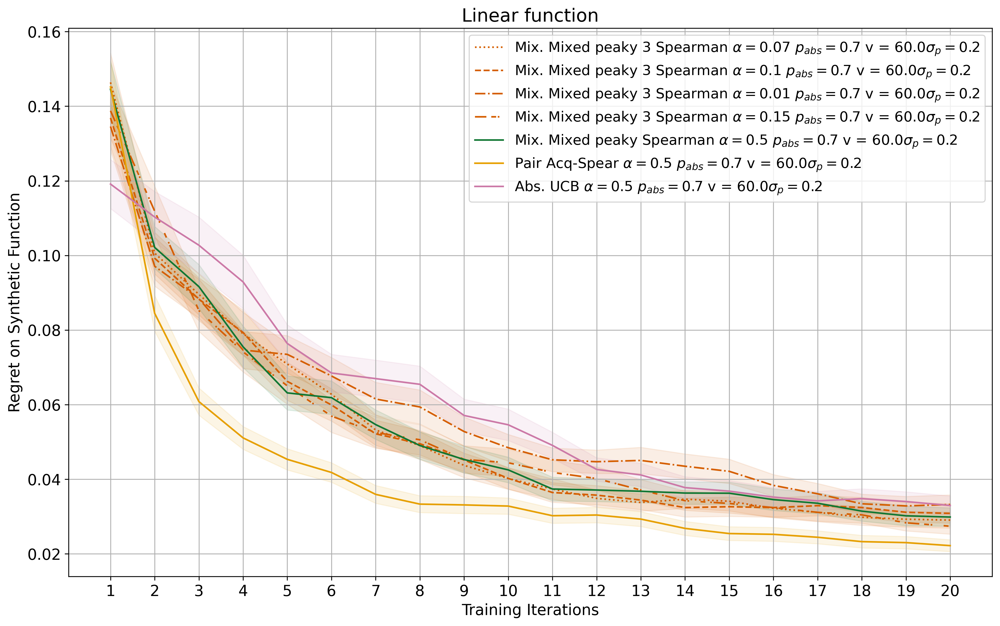

In [7]:
plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['linear'], ['0.95'], vs=['60.0'])
plt.title('Linear function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['linear'], ['0.8'], vs=['60.0'])
plt.title('Linear function')

plt.figure(figsize=figsize_l, dpi=dpi)
selector_plot(['SW_MIX_PEAK3_SPEAR', 'SW_MIX_PEAK_SPEAR', 'ACQ_SPEAR', 'ABS_UCB'], False, ['linear'], ['0.7'], vs=['60.0'])
plt.title('Linear function')

In [63]:
import scipy.stats as stats

def calculate_statistics(glob1, glob2):

    after_time = '2024-11-21_18-00-00'
    after_time_ucb = '2024-11-19_18-00-00'
    before_time = '2025-10-15_16-00-00'

    files1 = glob(glob1)
    files1 = filter_by_time(files1, before=before_time, after=after_time_ucb)

    files2 = glob(glob2)
    files2 = filter_by_time(files2, before=before_time, after=after_time)

    #print('len(files1) = ' + str(len(files1)))
    #print('len(files2) = ' + str(len(files2)))

    #print(files1)
    #print(files2)

    regrets1 = np.empty((0,))
    regrets2 = np.empty((0,))

    for i in range(0,len(files1)):
        data_file = np.load(files1[i])

        regret1 = np.mean(data_file['score_diff'], axis=2)
        regret_mean1 = np.mean(regret1, axis=1)
        regrets1 = np.append(regrets1, regret_mean1, axis=0)

        data_file2 = np.load(files2[i])

        regret2 = np.mean(data_file2['score_diff'], axis=2)
        regret_mean2 = np.mean(regret2, axis=1)
        regrets2 = np.append(regrets2, regret_mean2, axis=0)

    print(np.mean(regrets1))    
    print(np.mean(regrets2))

    r1 = regrets1
    r2 = regrets2
    for i in range(30):
        regrets1 = np.append(regrets1, r1, axis=0)
        regrets2 = np.append(regrets2, r2, axis=0)
    
    res = stats.ttest_ind(regrets1, regrets2, alternative='greater')
    
    c0 = regrets1
    c1 = regrets2
    
    cohens_d = (np.mean(c0) - np.mean(c1)) / (np.sqrt((np.std(c0) ** 2 + np.std(c1) ** 2) / 2))
    
    print(res)
    print(cohens_d)
    
    
glob1 = 'results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_300.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz'
glob2 = 'results/AT_SW_UCB_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.95_falp_0.5_no_v_300.0_sigabs_1.0_sigpair_1.0_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz'

glob8_ucb = 'results/AT_UCB_model_gp_rating_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_10.0_sigabs_1.0_sigpair_0.2_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz'
glob8_sw = 'results/AT_SW_UCB_SPEAR_model_gp_switch_stable_user_human_choice2_fake_min_pareto_False_kmed_medrand_ppair_0.95_pabs_0.8_falp_0.5_no_v_10.0_sigabs_1.0_sigpair_0.1_alpha_0.5_rbfl_1.2_rbfsig_1.0_env*/train_data.npz'


calculate_statistics(glob1, glob2)
print('\n')
calculate_statistics(glob8_ucb, glob8_sw)

0.03135273421481849
0.03037786976634439
TtestResult(statistic=1.7554141934312475, pvalue=0.03960659003293661, df=12398.0)
0.031530712541269657


0.04933258057950727
0.044835990420265565
TtestResult(statistic=5.21832427204676, pvalue=9.173169836794277e-08, df=12398.0)
0.09373142998657252
